In [1]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import rcParams
import time
from copy import copy as dup
from scipy.integrate import odeint, solve_ivp, complex_ode
from numba import int64
from numba import int32

# import fourier as ft
# from sim_handling import Simulation

import diffusionstuff10 as ds

#for 3d plots
# from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
# from mpl_toolkits.mplot3d import Axes3D

# for saving animations
import pickle
from matplotlib import animation
from IPython.display import HTML

In [2]:
# Graphics parameters
%matplotlib widget
ticklabelsize = 11
fontsize = 15
linewidth = 2

In [3]:
#Setting up the system
nx = 500 # Number of points in simulation box
xmax = 150
x = np.linspace(0, xmax, nx)
boxpoints = len(x)
deltax = x[1]-x[0]
Nbar = 1.0 # new Nbar from VMD, 260K
Nstar = .9/(2*np.pi)
nmid = int(nx/2)
xmid = max(x)/2
xmax = x[nx-1]
L = xmax/2

# Just conversions
nmpermonolayer = 0.3
umpersec_over_mlyperus = (nmpermonolayer/1e3*1e6)

# Diffusion coefficient
# D = 1.6e-4 # micrometers^2/microsecond
D = 0.002

# Diffusion coefficient scaled for this time step and space step
Doverdeltax2 = D/deltax**2

# Time steps
# dtmaxtimefactor = 50
dtmaxtimefactor = .5
dtmax = deltax**2/D
t_init = 0.0
# t_max = 50000
# t_max = dtmax/dtmaxtimefactor
deltat = 10#200#dtmax/dtmaxtimefactor
tspan = [t_init, t_init+deltat]

# Deposition rate
nu_kin = 250 # microns/second - about right for 260 K
nu_kin_mlyperus = nu_kin/umpersec_over_mlyperus # monolayers per microsecond

# Supersaturation
sigma0 = 0.19
sigmaIcorner = 0.21 # Must be bigger than sigma0 to get growth
center_reduction = 0.25 # In percent
c_r = center_reduction/100

# Overlying supersaturation
# sigmaI = ds.getsigmaI(x,xmax,center_reduction,sigmaIcorner,method='sinusoid')
sigmaI = ds.getsigmaI(x,xmax,center_reduction,sigmaIcorner,method='parabolic')

# odemethod = 'BDF'
odemethod = 'RK45'

# Reporting
print("D =", D, 'um^2/us',D * 1e-12*1e6*1e9, 'x 10^-9 m^2/sec')
print('deltat_max (Diffusion time) =', dtmax)
print('deltat =', deltat)
print('nu_kin_mlyperus =', nu_kin_mlyperus, 'monolayers/us')
print('nmid =', nmid)
print('N* =', Nstar)
print('N*x2pi =', Nstar*2*np.pi)
print('Nbar, Nbar-N*, N*/Nbar =', Nbar, Nbar-Nstar, Nstar/Nbar)
print('deltax =', deltax)
print('sigma_0 =', sigma0)
print('sigmaIcorner =', sigmaIcorner)
print('center reduction =', center_reduction, '%')
print('c_r =', c_r, 'dimensionless')
print('max growth rate =', nu_kin_mlyperus*sigmaIcorner*umpersec_over_mlyperus, 'um/sec')
print('min growth rate =', nu_kin_mlyperus*(sigmaIcorner-sigma0)*umpersec_over_mlyperus, 'um/sec')
print('nu_kin =', nu_kin, 'um/sec')
print('dx =', deltax)
print('L =', L, 'micrometers')

D = 0.002 um^2/us 2.0 x 10^-9 m^2/sec
deltat_max (Diffusion time) = 45.18054144360867
deltat = 10
nu_kin_mlyperus = 0.8333333333333334 monolayers/us
nmid = 250
N* = 0.1432394487827058
N*x2pi = 0.9
Nbar, Nbar-N*, N*/Nbar = 1.0 0.8567605512172942 0.1432394487827058
deltax = 0.30060120240480964
sigma_0 = 0.19
sigmaIcorner = 0.21
center reduction = 0.25 %
c_r = 0.0025 dimensionless
max growth rate = 52.5 um/sec
min growth rate = 4.999999999999998 um/sec
nu_kin = 250 um/sec
dx = 0.30060120240480964
L = 75.0 micrometers


In [4]:
uselayers = True

# 1D run parameters
if uselayers:
    layermax = 1000
    # layermax=500
else:
    countermax = 15000

In [5]:
### atm f1d nx is replaced by 2*N-2 for eaier comparisons with ft soln
# initial conditions and parameters

# N = int(nx/2 + 1)
N = 64


if N > (nx/2 + 1):
    print("bad choice")

xf = np.linspace(x[0],xmax,2*N-2)
xfmid = max(xf)/2

Ntot_init = np.ones(2*N-2)
Nqll_init = ds.getNQLL(Ntot_init,Nstar,Nbar)

sigmaIft = ds.getsigmaI(xf,xmax,center_reduction,sigmaIcorner,method='parabolic')

# Ntot_init_1D = np.ones(nx)
# NQLL_init_1D = ds.getNQLL(Ntot_init_1D,Nstar,Nbar)

tintervals = np.linspace(tspan[0],tspan[-1],nx)

# paramsarr = [Nbar, Nstar, sigmaI, sigma0, nu_kin_mlyperus, Doverdeltax2, nx] 
# paramsarr = [Nbar, Nstar, sigmaIft, sigma0, nu_kin_mlyperus, Doverdeltax2, nx] 

In [6]:
print("Starting a similar system")

params = {"N" : N,
          "Nstar" : Nstar,
          "nu_kin" : nu_kin,
          "nu_kin_mlyperus" : nu_kin_mlyperus,
          "Nbar" : Nbar,
          "sigma0" : sigma0,
          "sigmaI" : sigmaIft,
          "k" : np.arange(0,N),
          "D" : D/N,
          "Doverdeltax2" : Doverdeltax2,
          "nx" : nx,
          "ICNT" : Ntot_init,
        #   "ICNQ" : Nqll_init,
          "tinterval":tintervals}

Starting a similar system


In [7]:
### original(ish) solution

# Call the ODE solver
# ylast = np.array(Ntot_init_1D)
# ylast = np.array(Ntot_init)
ylast = ds.getNQLL(Ntot_init,Nstar,Nbar)

counter = 0
layer = 0
ttot = 0.0

def f1d_rhs(t,y):
    return ds.f1d_solve_ivp_1var_QLL(t,y,params)
    # return ds.f1d_solve_ivp_1var(t,y,params)

# Integrate up to next time step
sol = solve_ivp(fun=f1d_rhs, t_span=[tintervals[0],tintervals[-1]], y0=ylast, t_eval=tintervals, rtol=1e-12, method=odemethod)
ykeep_1D = sol.y
tkeep_1D = sol.t

c:\Users\elsla\IceResearch\icecontinuum\eslattery\diffusionstuff10.py:350: RuntimeWarning: invalid value encountered in sqrt
  dNqll = 2*np.pi*nu_kin_mlyperus*sigma_m * np.sqrt(Nstar**2 - (Nbar - Nqll0)**2)##Nstar*(np.cos(np.arcsin((Nbar - Nqll0)/Nstar))) ##THIS IS WRONG FIX IT


In [8]:
### storing originalish soln

ykeep_1D = np.array(ykeep_1D, np.float64)

Ntot = ykeep_1D
NQLL = ds.getNQLL(Ntot,Nstar,Nbar)
# NQLL = ykeep_1D
# Ntot = 1/(2*np.pi) * np.arcsin((Nbar - NQLL)/Nstar)

tkeep_1Darr = np.array(tkeep_1D, np.float64)

In [9]:
### experimenting w ft, in terms of nqll

import sys
import scipy as sp

def fftnorm(u_full):
    """Computes normalized FFT (such that FFT and IFFT are symmetrically normalized)
    
    Parameters
    ----------
    u_full : 1D Numpy Array (N,)
        The vector whose discrete FFT is to be computed

    Returns
    -------
    normalizedFFT : 1D Numpy Array (N,)
        The transformed version of that vector
    """

    normalizedFFT = np.fft.rfft(u_full,norm = "forward")
    return normalizedFFT

def ifftnorm(u_full):
    """Computes normalized IFFT (such that FFT and IFFT are symmetrically normalized)
    
    Parameters
    ----------
    u_full : 1D Numpy Array (N,)
        The vector whose discrete IFFT is to be computed

    Returns
    -------
    normalizedIFFT : 1D Numpy Array (N,)
        The transformed version of that vector
    """
    

    normalizedIFFT = np.fft.irfft(u_full, norm = "forward")
    return normalizedIFFT


def nQLLRHS(nQLLk,sigMk,params):
    """Computes RHS of Nqll in k space

    Parameters
    ----------
    nQLLk : 1D Numpy array (N,)
            Thickness of quasiliquid water layer, in k space
    sigMk : 1D Numpy array (N,)
            Sigma M, in k space
    params : Dictionary
             Dictionary of relevant parameters (see below)
        N : float, number of positive modes in simulation (unused explicitly here)
        nu_kin_mlyperus : float, speed of water vapor hitting qll layer in monolayers per microsecond
        sigma0 : (unused explicitly here)
        sigmaI : (unused explicitly here)
        k : 1D Numpy array (N,), array of available wavenumbers
        D : float, diffusion coefficient
        Nstar : float, best fit amplitude for sinusoidal NQLL(Ntot)
        Nbar : float, best fit intercept for sinusoidal NQLL(Ntot)        
        tinterval : 1D Numpy array (N,), timesteps for solver (unused explicitly here)
        ICNT : 1D Numpy array (N,), initial total thickness of qll and ice layers (unused explicitly here)
    
    Returns
    -------
    dnQLL : 1D Numpy array (N,)
        Array containing derivative of nQLL wrt t, in k space
    """

    D = params['D']
    nu_kin_mlyperus = params['nu_kin_mlyperus']
    Nstar = params['Nstar']
    Nbar = params['Nbar']
    k = params['k']

    Nqll = ifftnorm(nQLLk)
    convReal = ifftnorm(sigMk) * np.sqrt(Nstar**2 - (Nbar - Nqll)**2)##np.cos(np.arcsin((Nbar - Nqll)/Nstar))##(np.cos(np.arcsin((Nbar - ifftnorm(nQLLk))/Nstar)))) * Nstar
    
    n = int(len(Nqll)/2)
    for i in range (1,n-1):
        if Nqll[i-1] - Nqll[i] > 0:
            convReal[i] = -convReal[i]
    for i in range (n+1,len(Nqll)-1):
        if Nqll[i] - Nqll[i+1] < 0:
            convReal[i] = -convReal[i]
    # Correct center points to follow surrounding points
    for i in range (n-1, n+1):
        if convReal[i-1] <= 0 and convReal[i+3] <= 0:
            convReal[i] = -convReal[i]
    # Correct endpoints to follow leading points
    # Index 0
    if convReal[0] > 0 and convReal[1] < 0 and convReal[1]-convReal[2] < 0: # positive slope and next point is below zero so first must also
        convReal[0] = -convReal[0]
    if -convReal[0]-convReal[1] > 0 and convReal[1]-convReal[2] > 0: # 
        convReal[0] = -convReal[0]
    # Index -1
    if convReal[-1] > 0 and convReal[-2] < 0 and convReal[-2]-convReal[-3] < 0: # positive slope and prior point is below zero
        convReal[-1] = -convReal[-1]
    if -convReal[-1]-convReal[-2] > 0 and convReal[-2]-convReal[-3] > 0:
        convReal[-1] = -convReal[-1]    
        
    # Add to transformed diffusion
    dnQLL = - k**2 * D*nQLLk + 2*np.pi*nu_kin_mlyperus * fftnorm(convReal)

    ###
    tester(dnQLL,Nqll,params) # tester function to determine error as sim progresses
    ###
    return dnQLL
    
def tester(dnQ,Nq,params):
    dNq = ds.f1d_solve_ivp_1var_QLL(0,Nq,params)
    print('dnQ - dNq : ',ifftnorm(dnQ) - dNq)

def RHS(t,n,params):
    """Computes the RHS for the 1 variable system. For use in solver.
    
    Parameters
    ----------
    t : float
        Current time, for use in solver
        
    n : Numpy array (N,)
        Current state vector of positive modes (only total)
              
    params : Dictionary
             Dictionary of relevant parameters (see below)
        N : float, number of positive modes in simulation (unused explicitly here)
        nu_kin_mlyperus : float, speed of water vapor hitting qll layer in monolayers per microsecond (unused explicitly here)
        sigma0 : 
        sigmaI : 
        k : 1D Numpy array (N,), array of available wavenumbers (unused explicitly here)
        D : float, diffusion coefficient (unused explicitly here)
        Nstar : float, best fit amplitude for sinusoidal NQLL(Ntot)
        Nbar : float, best fit intercept for sinusoidal NQLL(Ntot)
        tinterval : 1D Numpy array (N,), timesteps for solver (unused explicitly here)
        ICNT : 1D Numpy array (N,), initial total thickness of qll and ice layers (unused explicitly here)

    Returns
    -------
    RHS : 1D Numpy array (N,)
          Derivative of each positive mode in state vector
    """
    
    # extract parameters from dictionary
    # Nstar = params['Nstar']
    # Nbar = params['Nbar']
    # sigma0 = params['sigma0']
    # sigmaI = params['sigmaI']
    
    # find NQLL in real space
    nQLL = n
    Nqll = ifftnorm(nQLL)
    
    # calc sigma M and transform
    # sigmaM = ds.getsigmaM(Nqll,[Nbar,Nstar,sigmaI,sigma0])
    sigmaM = ds.getsigmaM(Nqll,params)
    sigMk = fftnorm(sigmaM)

    # calc dnQLL/dt in k space and return as array
    dnQ = nQLLRHS(nQLL,sigMk,params)
    RHS = np.array(dnQ)
    return RHS


def runSim(params):
    """Runs a simulation of the ice continuum in Fourier space
    
    Parameters
    ----------
    params : Dictionary
             Dictionary of relevant parameters (see below)
        N : float, number of positive modes in simulation
        nu_kin_mlyperus : float, speed of water vapor hitting qll layer in monolayers per microsecond
        sigma0 : 
        sigmaI : 
        k : 1D Numpy array (N,), array of available wavenumbers
        D : float, diffusion coefficient
        Nstar : float, best fit amplitude for sinusoidal NQLL(Ntot)
        Nbar : float, best fit intercept for sinusoidal NQLL(Ntot)
        tinterval : 1D Numpy array (N,), timesteps for solver
        ICNT : 1D Numpy array (N,), initial total thickness of qll and ice layers
        
    Returns
    -------
    uSim : ODE solver output
           Output solution from sp.integrate.solve_ivp (includes state vector at all timesteps, time vector, etc.)
    """
    
    # unpack parameters from dictionary
    N = params['N']
    ICNT = params['ICNT']
    tinterval = params['tinterval']
    Nstar = params['Nstar']
    Nbar = params['Nbar']
    
    nQLLIC = fftnorm(ds.getNQLL(ICNT,Nstar,Nbar))[:N]
    n = np.array(nQLLIC)
    
    # define RHS in form appropriate for solve_ivp
    def myRHS(t,y):
        out = RHS(t,y,params)
        return out

    # Call the ODE solver
    solv = solve_ivp(fun=myRHS, t_span=[tinterval[0],tinterval[-1]], y0=n, t_eval = tinterval, rtol=1e-12, method=odemethod)
    ykeep_ft = solv.y
    tkeep_ft = solv.t
    return [ykeep_ft,tkeep_ft]


def makeReal(fourierSol,params): 
    """Transforms the solution to the PDE back into real x space

    Parameters
    ----------
    fourierSol : 2D Numpy array (2,N)
        Array containing y solutions to RHS at position 0 and timesteps at position 1
    params : Dictionary
             Dictionary of relevant parameters (see below)
        N : float, number of positive modes in simulation
        nu_kin_mlyperus : float, speed of water vapor hitting qll layer in monolayers per microsecond (unused explicitly here)
        sigma0 : (unused explicitly here)
        sigmaI : (unused explicitly here)
        k : 1D Numpy array (N,), array of available wavenumbers (unused explicitly here)
        D : float, diffusion coefficient (unused explicitly here)
        Nstar : float, best fit amplitude for sinusoidal NQLL(Ntot) (unused explicity here)
        Nbar : float, best fit intercept for sinusoidal NQLL(Ntot) (unused explicitly here)
        tinterval : 1D Numpy array (N,), timesteps for solver (unused explicitly here)
        ICNT : 1D Numpy array (N,), initial total thickness of qll and ice layers (unused explicitly here)
    
    Returns
    -------
    Nqll : 2D Numpy array (somesize)
        Array containing thickness of the quasiliquid layer, in real xt space
    """

    N = params['N']
    # print(N)
    timesteps = fourierSol.shape[1]
    # print(fourierSol.shape[1])
    # NTot = np.zeros((timesteps,2*N-2))
    Nqll = np.zeros((timesteps,2*N-2))
    # print(ifftnorm(fourierSol[:,0]).shape)
    for i in range(timesteps):
        # NTot[i,:] = ifftnorm(fourierSol[:,i])
        Nqll[i,:] = ifftnorm(fourierSol[:,i])
        
    return Nqll
# def makeReal(fourierSol,params):
#     N = params['N']
#     print('from makeReal, N: ',N)
#     timesteps = fourierSol.shape[1]
#     print('timesteps: ', timesteps)
#     Nqll = np.zeros((timesteps,2*N-2))

#     for i in range(timesteps):
#         Nqll[i,:] = ifftnorm(fourierSol[:,i])
        
#     return Nqll

In [10]:
### testing runsim 

Ntinit = params['ICNT']
Nstar = params['Nstar']
Nbar = params['Nbar']
tinterval = params['tinterval']

Nqll = ds.getNQLL(Ntinit,Nstar,Nbar)
nqll = fftnorm(Nqll)

def rhs(t,y):
    return RHS(t,y,params)

solv = solve_ivp(fun=rhs, t_span=[tinterval[0],tinterval[-1]], y0=nqll, t_eval=tinterval, method=odemethod)
ykeepft = solv.y
tkeepft = solv.t

ksoln = np.array([ykeepft,tkeepft])
rsoln = makeReal(ksoln[0],params)

dnQ - dNq :  [ 1.57534247e-01 -4.16333634e-17 -4.16333634e-17 -1.38777878e-17
 -1.38777878e-17 -5.55111512e-17 -2.77555756e-17 -4.16333634e-17
 -4.16333634e-17 -4.16333634e-17 -2.77555756e-17 -1.38777878e-17
 -4.16333634e-17 -1.38777878e-17 -5.55111512e-17 -2.77555756e-17
 -1.38777878e-17 -4.16333634e-17 -1.38777878e-17  0.00000000e+00
 -4.16333634e-17  1.38777878e-17  2.77555756e-17 -1.38777878e-17
 -4.16333634e-17 -2.77555756e-17 -1.38777878e-17  1.38777878e-17
  0.00000000e+00 -1.38777878e-17  0.00000000e+00  0.00000000e+00
 -4.16333634e-17 -2.77555756e-17 -1.38777878e-17 -1.38777878e-17
 -1.38777878e-17 -2.77555756e-17 -5.55111512e-17  1.38777878e-17
  1.38777878e-17 -2.77555756e-17 -1.38777878e-17 -2.77555756e-17
 -1.38777878e-17 -1.38777878e-17  0.00000000e+00  0.00000000e+00
 -4.16333634e-17  0.00000000e+00 -4.16333634e-17 -1.38777878e-17
  1.38777878e-17  0.00000000e+00 -1.38777878e-17 -2.77555756e-17
 -6.93889390e-17  0.00000000e+00  0.00000000e+00 -4.16333634e-17
 -2.77555756

C:\Users\elsla\AppData\Local\Temp\ipykernel_16936\4038882563.py:77: RuntimeWarning: invalid value encountered in sqrt
  convReal = ifftnorm(sigMk) * np.sqrt(Nstar**2 - (Nbar - Nqll)**2)##np.cos(np.arcsin((Nbar - Nqll)/Nstar))##(np.cos(np.arcsin((Nbar - ifftnorm(nQLLk))/Nstar)))) * Nstar
c:\Users\elsla\anaconda3\lib\site-packages\scipy\integrate\_ivp\rk.py:109: RuntimeWarning: invalid value encountered in true_divide
  return norm(self._estimate_error(K, h) / scale)



dnQ - dNq :  [ 9.77133305e-10  2.34938291e-10 -9.53699064e-11  1.16529564e-11
 -3.51767504e-11 -1.06882420e-11 -2.49671811e-11 -1.58634217e-11
 -2.19396723e-11 -1.76085813e-11 -2.07228817e-11 -1.83296572e-11
 -2.01259842e-11 -1.86632515e-11 -1.97870054e-11 -1.88257049e-11
 -1.95712196e-11 -1.89038091e-11 -1.94208677e-11 -1.89371574e-11
 -1.93081939e-11 -1.89454008e-11 -1.92190153e-11 -1.89391558e-11
 -1.91453103e-11 -1.89243204e-11 -1.90824578e-11 -1.89046973e-11
 -1.90276545e-11 -1.88822985e-11 -1.89791238e-11 -1.88585814e-11
 -1.89356586e-11 -1.88346838e-11 -1.88963983e-11 -1.88111471e-11
 -1.88608851e-11 -1.87883875e-11 -1.88286609e-11 -1.87667659e-11
 -1.87994897e-11 -1.87465182e-11 -1.87731636e-11 -1.87277832e-11
 -1.87494881e-11 -1.87107552e-11 -1.87283522e-11 -1.86955035e-11
 -1.87097421e-11 -1.86820143e-11 -1.86935328e-11 -1.86705373e-11
 -1.86795995e-11 -1.86609617e-11 -1.86679977e-11 -1.86534121e-11
 -1.86585886e-11 -1.86478194e-11 -1.86514137e-11 -1.86443638e-11
 -1.8646431

C:\Users\elsla\AppData\Local\Temp\ipykernel_16936\2610153200.py:17: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ksoln = np.array([ykeepft,tkeepft])


In [11]:
### original 
# ylast = np.array(Ntot_init)
# # ylast = np.array(NQLL_init_1D)

# counter = 0
# layer = 0
# ttot = 0.0

# def f1d_rhs(t,y):
#     # return ds.f1d_solve_ivp_1var_QLL(t,y,paramsarr)
#     return ds.f1d_solve_ivp_1var(t,y,paramsarr)

# # Integrate up to next time step
# sol = solve_ivp(fun=f1d_rhs, t_span=[tintervals[0],tintervals[-1]], y0=ylast, t_eval=tintervals, rtol=1e-12, method=odemethod)
# ykeep_1D = sol.y
# tkeep_1D = sol.t

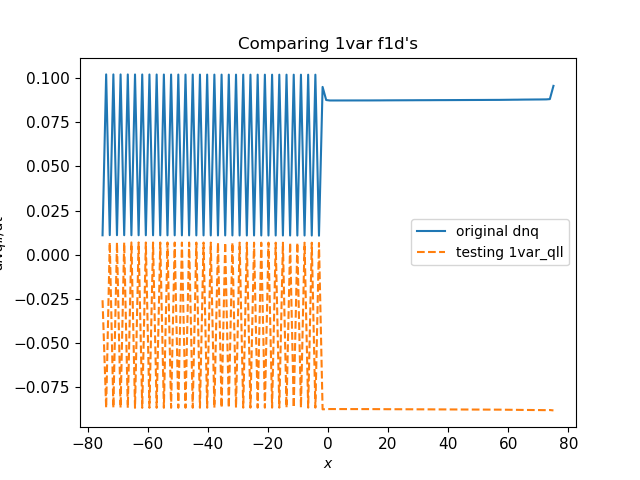

In [23]:
### testing rhs derivative, 1var ntot or nqll

plt.close()

# der = RHS(0,fftnorm(Nqll_init),params)
# print(ifftnorm(der))

# a = 0
a = -1
# a = 17
# a = -10
# a = 434
###
# a = 481
# a = 58
# a = 165
# a = 217
# a = 12

# print((fftnorm(NQLL[:,a])))
# der = RHS(0,fftnorm(NQLL[:,a]),params)
der = np.array(ds.f1d_solve_ivp_1var_QLL(0,NQLL[:,a],params))
oridntt = np.array(ds.f1d_solve_ivp_1var(0,Ntot[:,a],params))
oridnqq = Nstar * 2*np.pi * oridntt * np.cos(2*np.pi*Ntot[:,a])
# oridntt = np.array(ds.f1d_solve_ivp_1var(0,Ntot_init,paramsarr))
# oridnqq =  Nstar * 2*np.pi * oridntt * np.cos(2*np.pi*Ntot_init)

# print(ifftnorm(der))
# print(ifftnorm(der))
# print(NQLL[:,a])
# print(NQLL[16,a])
# print(NQLL[21,a])
# print(max(NQLL[:,a]))
# print(min(NQLL[:,a]))

# # i=0
# for i in range (len(ifftnorm(der))):
#     if ifftnorm(der)[i] > 0.0060929 and ifftnorm(der)[i] < 0.00609297:
#         print(i)
# print((ifftnorm(der)[7]))
# print((ifftnorm(der)[30]))
# print(NQLL[7,a] - NQLL[7+1,a])

# # plt.figure()
# for x in range(len(der)):
#         plt.plot([0,der[x].real],[0,der[x].imag],'ro-',label='python')
plt.figure()
plt.plot(xf-xfmid,oridnqq,label='original dnq')
# plt.plot(xf,ifftnorm(der),label='ft',linestyle='--')
plt.plot(xf-xfmid,der,label='testing 1var_qll',linestyle='--')
# plt.plot(np.linspace(xf[0],xf[-1],N),fftnorm(NQLL[:,a]))
# plt.plot(xf,NQLL[:,a]-1+Nstar)

# plt.axvline(xf[7])
# plt.axvline(xf[30])
# plt.axvline(xf[15])
# plt.axvline(xf[22])
# plt.axvline(xf[5])
# plt.axvline(xf[34])
# plt.axvline(xf[16])
# plt.axvline(xf[21])

plt.title('Comparing 1var f1d\'s')
plt.xlabel('$x$')
plt.ylabel('$dNqll/dt$')
# print(ifftnorm(der))
plt.legend()

In [13]:
# soln = runSim(params)
# # print(soln)
# # # print('here')
# realSoln = makeReal(soln[0],params)

In [14]:
# plt.figure()
# nk,nt = np.shape(soln[0])
# for i in range(nt):
#     plt.plot(np.arange(0,N),soln[0][:,i].real,label=str(tintervals[i]))
# plt.xlabel('k')
# plt.ylabel('real part of solution')
# plt.grid(True)
# plt.legend()

In [15]:
# plt.figure()
# nk,nt = np.shape(soln[0])
# for i in range(nt):
#     plt.plot(np.arange(0,N),soln[0][:,i].imag,label=str(tintervals[i]))
# plt.grid(True)
# plt.xlabel('k')
# plt.ylabel('imaginary part of solution')
# plt.legend()

In [16]:
# ## animation of original 1var dnqdt and transformed 1var dnqdt
# p = 0

# myFig = plt.figure()
# ax = plt.subplot()
# ax.set_title('dnq/dt to nqll')
# ax.axis(xmin = x[0] - xmid,xmax = x[-1] - xmid,ymin = -0.2, ymax = 0.2)
# # create initial frames
# lineList = [ax.plot([],[]) for i in range (4)]
# # lineList[0] = ax.plot(x - xmid,np.zeros(len(x)),linestyle='--',label='testing dnq/dt',color='red')
# # lineList[1] = ax.plot(x - xmid,np.zeros(len(x)),label='dnq/dt')
# ax.set_xlabel('x')
# ax.set_ylabel('dnq/dt')
# # define function to draw each frame
# def makeFrame(n):
#     # testdnq = ifftnorm(RHS(0,fftnorm(NQLL[:,n]),params))
#     testdnq = ds.f1d_solve_ivp_1var_QLL(0,NQLL[:,n],params)
#     oridnt = np.array(ds.f1d_solve_ivp_1var(0,Ntot[:,n],params))
#     oridnq =  Nstar * 2*np.pi * oridnt * np.cos(2*np.pi*Ntot[:,n])
#     lineList[0][0].set_data(xf - xmid,testdnq)
#     lineList[0][0].set_linestyle('--')
#     lineList[0][0].set_label('testing dnq/dt')

#     lineList[1][0].set_data(xf - xmid,oridnq)
#     lineList[1][0].set_label('dnq/dt')
#     lineList[2][0].set_label('t = ' + str(tintervals[n]))
#     lineList[3][0].set_label('n = ' + str(n))

#     ax.legend()
#     return lineList


# # generate animations
# anim1 = animation.FuncAnimation(fig = myFig,func = makeFrame,frames = len(tkeep_1D))
# plt.close()
# HTML(anim1.to_jshtml())

In [17]:
# ykeep_ft = np.array(realSoln, np.float64)
# Ntotkeep_ft = realSoln[:]
# # print(realSoln)
# Nqllkeep_ft = ds.getNQLL(Ntotkeep_ft,Nstar,Nbar)
# realSoln = makeReal(soln[0],params)
# NtotFinalFT = Ntotkeep_ft[-1]
# NqllFinalFT = Nqllkeep_ft[-1]

tkeep_ftarr = np.array(ksoln[1],np.float64)#np.array(soln[1], np.float64)
# Nicekeep_ft = Ntotkeep_ft-Nqllkeep_ft
# NiceFinalFT = NtotFinalFT-NqllFinalFT
Nqllkeep_ft = rsoln#realSoln[:]
# Ntotkeep_ft = 1/(2*np.pi) * np.arcsin((Nbar - Nqllkeep_ft)/Nstar)
# Nicekeep_ft = Ntotkeep_ft-Nqllkeep_ft

# print(Nqllkeep_ft)

(126,)


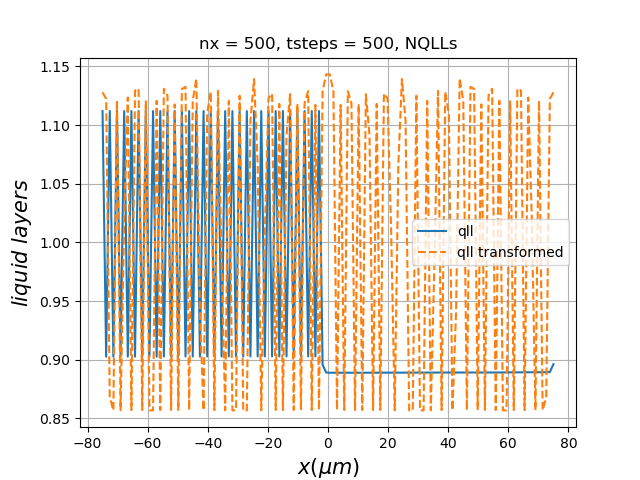

In [18]:
colorIce = 'k'
colorTot = 'b'
colorSteps = 'cyan'
colorT = 'red'

a = -1
print(np.shape(Nqllkeep_ft[a,:]))

plt.figure()
plt.title('nx = ' + str(nx) + ', tsteps = ' + str(len(tinterval)) + ', NQLLs')
plt.plot(xf-xfmid, NQLL[:,a], label='qll')
# plt.plot(x-xmid, Nice[:,a], color=colorIce, label='ice', lw=linewidth,linestyle='-')
# plt.plot(x-xmid, Ntot[:,a], color=colorTot, label='ice+liquid', lw=linewidth,linestyle='-')
plt.plot(xf-xfmid,Nqllkeep_ft[a], label='qll transformed',linestyle='--')
# plt.plot(xf-xfmid, Nicekeep_ft[a], color=colorT, label='ice transformed', linestyle='--')
# plt.plot(xf-xfmid, Ntotkeep_ft[a], color='purple', label='ice+liquid transformed', linestyle='--')
plt.xlabel(r'$x (\mu m$)',fontsize=fontsize)
plt.ylabel(r'$liquid \ layers$',fontsize=fontsize)
# plt.xlim([-xmid, xmid])
# plt.ylim([0,550])
rcParams['xtick.labelsize'] = ticklabelsize 
rcParams['ytick.labelsize'] = ticklabelsize
plt.legend()
plt.grid('on')

#######################################################################
## NOTE so far, Nqllkeep_ft is concave up and parabolic at O(1e-6)
##                   NQLL is concave down and parabolic at O(1e-5) all at t=-1

In [19]:
# testy = Ntot[:,-1]
# testn = fftnorm(testy)[:N]

# rhstest = RHS(tintervals[-1],testn,params)
# rhsreals = ifftnorm(rhstest)
# f1degTOT = ds.f1d_solve_ivp_1var(tintervals[-1],testy,paramsarr)

# plt.figure()
# # plt.plot(x-xmid,f1deg-rhsreals,label='f1d')
# plt.plot(xf-xfmid,rhsreals,label='rhs',linestyle='--')
# plt.legend()

In [20]:
# ## animation of ntot original and transformed solution

# myFig = plt.figure()
# ax = plt.subplot()
# ax.set_title('Ntot')
# ax.axis(xmin = xf[0]-xmid,xmax = xf[-1]-xmid)#,ymin = -1, ymax = 5)
# # create initial frames
# lineList = [ax.plot([],[]) for i in range (2)]
# lineList[0] = ax.plot(xf - xmid,Ntotkeep_ft[0,:],linestyle='--',label='transformed Ntot',color='red')
# lineList[1] = ax.plot(x-xmid,Ntot[:,0],label='original Ntot',color='blue')
# # define function to draw each frame
# def makeFrame(n):
#     lineList[0][0].set_data(xf - xmid,Ntotkeep_ft[n])
#     lineList[1][0].set_data(x-xmid, Ntot[:,n])
#     return lineList
# ax.legend()

# # generate animations
# anim1 = animation.FuncAnimation(fig = myFig,func = makeFrame,frames = len(tkeep_ftarr))

# plt.close()
# HTML(anim1.to_jshtml())

In [21]:
# ## animation of nqll original

# myFig = plt.figure()
# ax = plt.subplot()
# ax.set_title('NQLL')
# ax.axis(xmin = x[0]-xmid,xmax = x[-1]-xmid,ymin = 0, ymax = 1.5)
# # create initial frames
# lineList = [ax.plot([],[]) for i in range (3)]
# lineList[0] = ax.plot(x - xmid,NQLL[:,0],linestyle='--',label='transformed Ntot',color='red')

# # define function to draw each frame
# def makeFrame(n):
#     lineList[0][0].set_data(x - xmid,NQLL[:,n])
#     lineList[1] = ax.axhline(Nbar - Nstar)
#     lineList[2] = ax.axhline(Nbar + Nstar)
#     return lineList
# ax.legend()

# # generate animations
# anim1 = animation.FuncAnimation(fig = myFig,func = makeFrame,frames = len(tkeep_1D))

# plt.close()
# HTML(anim1.to_jshtml())